In [101]:
import numpy as np 
import pandas as pd 
import keras
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn import metrics
import os
from PIL import Image
left = 250
top = 100
right = 3600
bottom = 2500
RESAMPLE_PER_CLASS_DICT = {0:0, 1:12, 2:5, 3:26, 4:28}
trainLabels = pd.read_csv('/home/ubuntu/CURRENT_INPUT.csv')


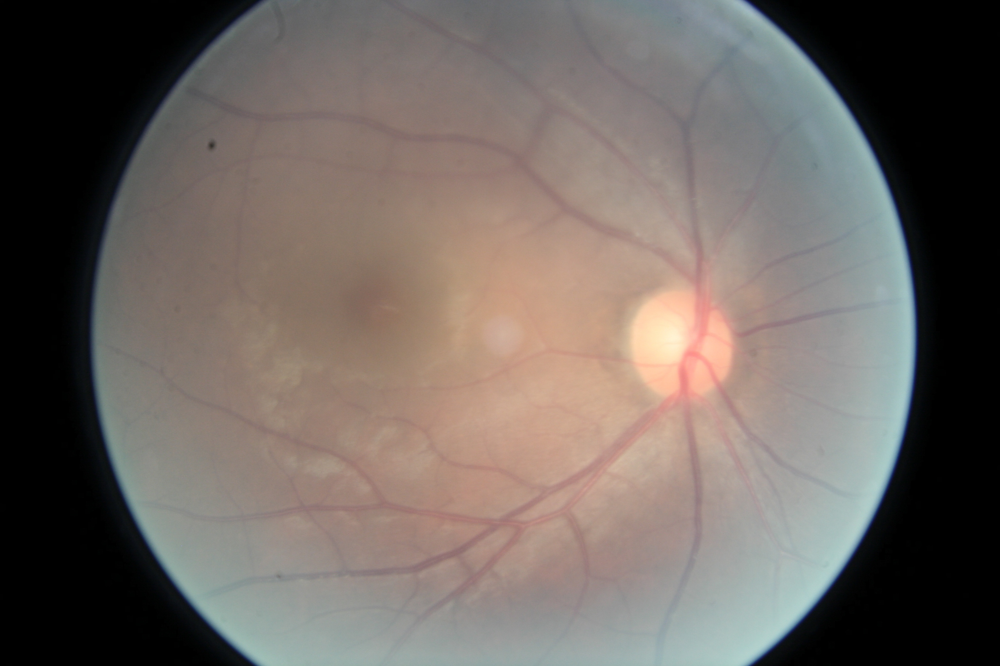

In [71]:
image = Image.open('/home/ubuntu/CS230_INPUT/1186_left.jpeg')
image

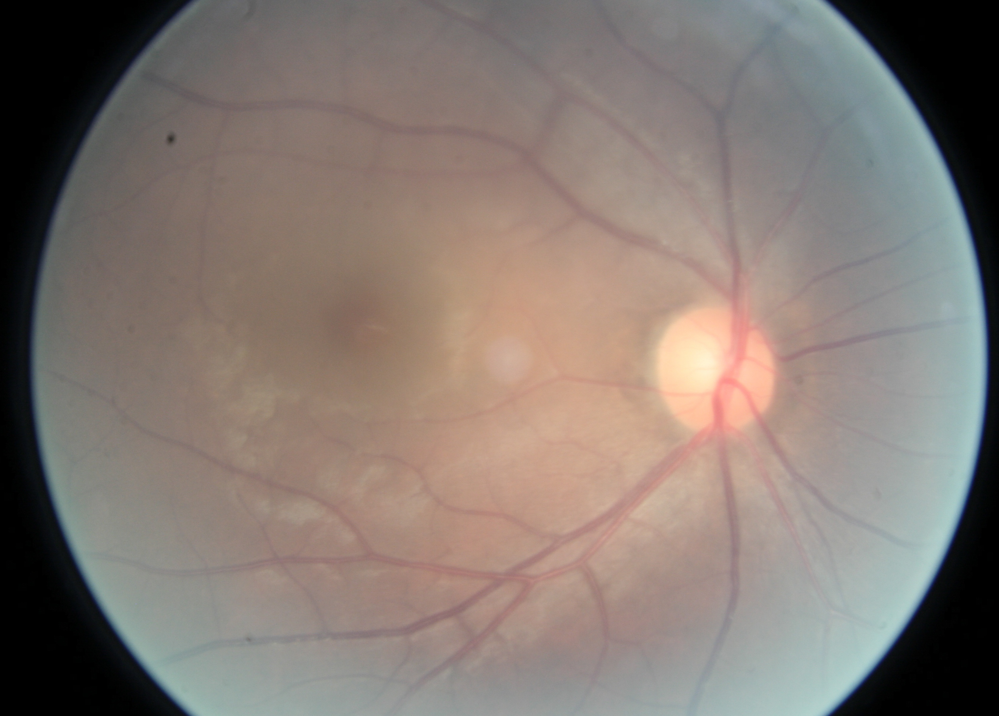

In [100]:
left = 250
top = 100
right = 3600
bottom = 2500
im = image.crop(box=[left, top, right, bottom])
im
#(3888, 2592)

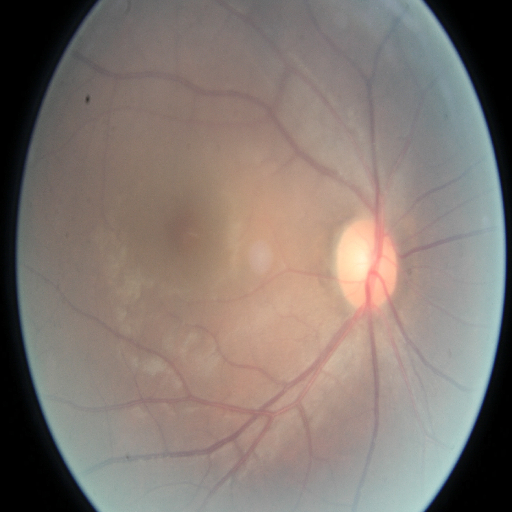

In [103]:
im1 = im.resize((512,512))
im1

In [120]:

def re_sample(IMAGE_ARR, LABEL, TRAIN_IMAGE_ARRAY, TRAIN_LABEL_ARRAY):
    RANGE = RESAMPLE_PER_CLASS_DICT[LABEL]
    for i in range(RANGE):
        TRAIN_IMAGE_ARRAY.append(IMAGE_ARR)
        TRAIN_LABEL_ARRAY.append(LABEL)
    return TRAIN_IMAGE_ARRAY,TRAIN_LABEL_ARRAY  
    

test_label_dict = {}
train_label_dict = {}

current_input_train_labels = []
current_input_test_labels = []

input_train_labels = []

train_images = []
test_images = []

train_images_class_0 = []
train_images_other_classes = []

class_0_label = []
other_class_label = []

count = 0

for i in range(len(trainLabels[:1000])):
    #print ("IN HERE1", i)
    train_label_dict[trainLabels.iloc[i].image] = trainLabels.iloc[i].level
    image = Image.open('/home/ubuntu/CS230_INPUT/'+trainLabels.iloc[i].image+".jpeg")
    im1 = image.crop(box=[left, top, right, bottom])
    im = im1.resize((512, 512))
    arr = keras.preprocessing.image.img_to_array(im)
    current_input_train_labels.append(trainLabels.iloc[i].level)
    input_train_labels.append(trainLabels.iloc[i].level)
    train_images.append(arr)
    if(int(trainLabels.iloc[i].level) == 0):
        if(count > 500):
            continue
        train_images_class_0.append(arr)
        class_0_label.append(trainLabels.iloc[i].level)
        count = count + 1
    else:
        train_images_other_classes.append(arr)
        other_class_label.append(trainLabels.iloc[i].level)   
        if(trainLabels.iloc[i].level != 2):
            im2 = image.resize((512, 512))
            arr2 = keras.preprocessing.image.img_to_array(im2)
            for w in range(10):
                train_images_other_classes.append(arr2)
                other_class_label.append(trainLabels.iloc[i].level)
    #train_images , input_train_labels = re_sample(arr, int(trainLabels.iloc[i].level), train_images, input_train_labels)
    
    
for j in range(len(trainLabels[1000:1200])):
    #print ("IN HERE2", j)
    test_label_dict[trainLabels.iloc[j + 1000].image] = trainLabels.iloc[j + 1000].level
    image = Image.open('/home/ubuntu/CS230_INPUT/'+trainLabels.iloc[j + 1000].image+".jpeg")
    im1 = image.crop(box=[left, top, right, bottom])
    im = image.resize((512, 512))
    arr = keras.preprocessing.image.img_to_array(im)
    test_images.append(arr)
    current_input_test_labels.append(trainLabels.iloc[j + 1000].level)
    

In [158]:
for j in range(len(trainLabels[2000:3500])):
    #print ("IN HERE2", j)
    test_label_dict[trainLabels.iloc[j + 2000].image] = trainLabels.iloc[j + 2000].level
    image = Image.open('/home/ubuntu/CS230_INPUT/'+trainLabels.iloc[j + 2000].image+".jpeg")
    im1 = image.crop(box=[left, top, right, bottom])
    im = im1.resize((512, 512))
    arr = keras.preprocessing.image.img_to_array(im)
    test_images.append(arr)
    current_input_test_labels.append(trainLabels.iloc[j + 2000].level)

In [121]:
len(train_images_class_0)

501

In [122]:
len(train_images_other_classes)

1478

In [123]:
total_train_ = []
for i in train_images_class_0:
    total_train_.append(i)
for j in train_images_other_classes:
    total_train_.append(j)
len(total_train_)    

1979

In [124]:
len(total_train_)
total_train_labels = []
for i in class_0_label:
    total_train_labels.append(i)
    
for j in other_class_label:
    total_train_labels.append(j)
    
    
len(total_train_labels)

1979

(array([732.,   0.,  71.,   0.,   0., 147.,   0.,  18.,   0.,  32.]),
 array([0. , 0.4, 0.8, 1.2, 1.6, 2. , 2.4, 2.8, 3.2, 3.6, 4. ]),
 <a list of 10 Patch objects>)

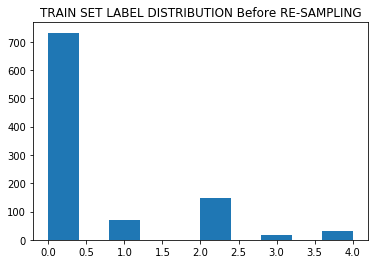

In [127]:
plt.title("TRAIN SET LABEL DISTRIBUTION Before RE-SAMPLING")
plt.hist(input_train_labels)

(array([501.,   0., 273.,   0.,   0.,  50.,   0.,  77.,   0.,  99.]),
 array([0. , 0.4, 0.8, 1.2, 1.6, 2. , 2.4, 2.8, 3.2, 3.6, 4. ]),
 <a list of 10 Patch objects>)

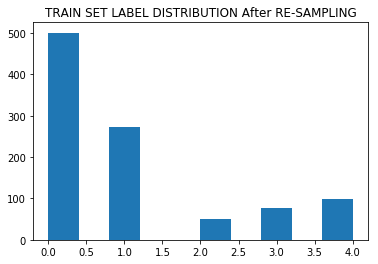

In [142]:
plt.title("TRAIN SET LABEL DISTRIBUTION After RE-SAMPLING")
plt.hist(total_train_labels[:1000])

(array([1989.,    0.,  198.,    0.,    0.,  402.,    0.,   52.,    0.,
          59.]),
 array([0. , 0.4, 0.8, 1.2, 1.6, 2. , 2.4, 2.8, 3.2, 3.6, 4. ]),
 <a list of 10 Patch objects>)

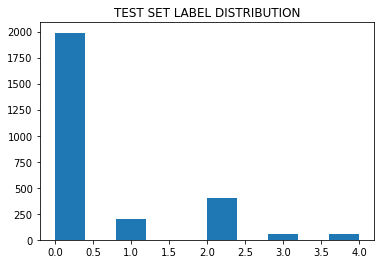

In [159]:
plt.title("TEST SET LABEL DISTRIBUTION")
plt.hist(current_input_test_labels)

In [141]:
train_image_matrix.shape

(1000, 512, 512, 3)

In [140]:
train_image_matrix = np.asarray(total_train_[:1000])

MemoryError: 

In [145]:
one_hot_vector_labels = keras.utils.to_categorical(total_train_labels[:1000], 5)

In [14]:
dataGenInput = keras.preprocessing.image.ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    width_shift_range=0.2,
    height_shift_range=0.2,
    brightness_range=[0.2,1.0]
    )
dataGenInput.fit(train_image_matrix, augment=True, seed=1)

In [77]:
#BASELINE MODEL: LOGISTIC REGRESSION
LR_BASELINE = keras.models.Sequential([
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation='sigmoid'),
    keras.layers.Dense(5, activation='softmax')
])

LR_BASELINE.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

LR_BL_MODEL = LR_BASELINE.fit(train_image_matrix, one_hot_vector_labels, epochs=20)

LR_BASELINE.summary()

Epoch 1/20
2043/2043 [==============================] - 6s 3ms/step - loss: 1.5947 - acc: 0.4239
Epoch 2/20
2043/2043 [==============================] - 5s 2ms/step - loss: 1.5654 - acc: 0.4254
Epoch 3/20
2043/2043 [==============================] - 5s 2ms/step - loss: 1.5400 - acc: 0.4254
Epoch 4/20
2043/2043 [==============================] - 5s 2ms/step - loss: 1.5175 - acc: 0.4254
Epoch 5/20
2043/2043 [==============================] - 5s 2ms/step - loss: 1.4979 - acc: 0.4254
Epoch 6/20
2043/2043 [==============================] - 5s 2ms/step - loss: 1.4807 - acc: 0.4254
Epoch 7/20
2043/2043 [==============================] - 5s 2ms/step - loss: 1.4657 - acc: 0.4254
Epoch 8/20
2043/2043 [==============================] - 5s 2ms/step - loss: 1.4526 - acc: 0.4254
Epoch 9/20
2043/2043 [==============================] - 5s 2ms/step - loss: 1.4413 - acc: 0.4254
Epoch 10/20
2043/2043 [==============================] - 5s 2ms/step - loss: 1.4316 - acc: 0.4254
Epoch 11/20
2043/2043 [======

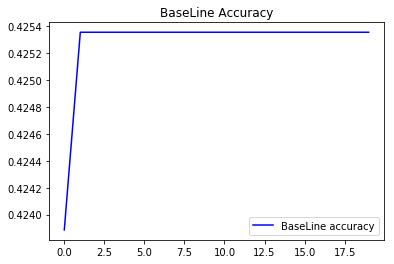

In [78]:
accuracy = LR_BL_MODEL.history['acc']
loss = LR_BL_MODEL.history['loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b', label='BaseLine accuracy')
plt.title('BaseLine Accuracy')
plt.legend()
plt.show()

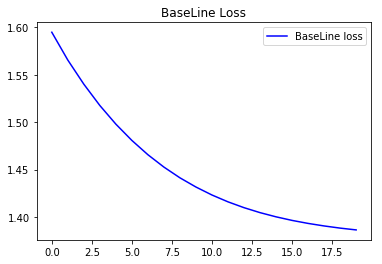

In [79]:
plt.plot(epochs, loss, 'b', label='BaseLine loss')
plt.title('BaseLine Loss')
plt.legend()
plt.show()

In [80]:
test_images_ = np.asarray(test_images)
PREDICT = LR_BASELINE.predict_classes(test_images_)
metrics.accuracy_score(PREDICT, current_input_test_labels)

0.15416666666666667

In [81]:
import sklearn.metrics
sklearn.metrics.f1_score(PREDICT, current_input_test_labels, average='macro')

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/sklearn/metrics/classification.py:1439: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


0.05342960288808664

In [82]:
sklearn.metrics.precision_score(PREDICT, current_input_test_labels, average='macro')

0.2

In [146]:
model = keras.models.Sequential([
  keras.layers.Conv2D(32, (4, 4), strides=2, activation='relu', input_shape=(512, 512, 3), data_format="channels_last"),
  keras.layers.Conv2D(32, (4, 4), padding="same", activation='relu', input_shape=(512, 512, 3), data_format="channels_last"),
  keras.layers.Conv2D(32, (4, 4), strides=1, activation='relu', input_shape=(255, 255, 32), data_format="channels_last"),
  keras.layers.Conv2D(32, (4, 4), padding="same", activation='relu', input_shape=(255, 255, 32), data_format="channels_last"),  
  keras.layers.MaxPooling2D(pool_size=(3, 3), strides=2, data_format="channels_last"),  
  keras.layers.Conv2D(64, (4, 4), strides=2, activation='relu', input_shape=(127, 127, 32), data_format="channels_last"),
  keras.layers.Conv2D(64, (4, 4), padding="same", activation='relu', input_shape=(127, 127, 32), data_format="channels_last"),  
  keras.layers.Conv2D(64, (4, 4), strides=1, activation='relu', input_shape=(62, 62, 64), data_format="channels_last"),  
  keras.layers.MaxPooling2D(pool_size=(3, 3), strides=2, data_format="channels_last"),  
  keras.layers.Conv2D(128, (4, 4), activation='relu', input_shape=(31, 31, 64), data_format="channels_last"),
  keras.layers.Conv2D(128, (4, 4), padding="same", activation='relu', input_shape=(28, 28, 128), data_format="channels_last"),
  keras.layers.Conv2D(128, (4, 4), padding="same", activation='relu', input_shape=(28, 28, 128), data_format="channels_last"),
  keras.layers.Conv2D(128, (4, 4), activation='relu', input_shape=(28, 28, 128), data_format="channels_last"),  
  keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2, data_format="channels_last"),
  keras.layers.Conv2D(64, (2, 2), strides=2, activation='relu', input_shape=(14, 14, 128), data_format="channels_last"),  
  keras.layers.MaxPooling2D(pool_size=(2, 2), data_format="channels_last"),  
  keras.layers.Flatten(),
  keras.layers.Dense(1024, activation='relu', kernel_initializer=keras.initializers.glorot_normal()),     
  keras.layers.Dense(512, activation='relu', kernel_initializer=keras.initializers.glorot_normal()),
  keras.layers.Dense(512, activation='relu', kernel_initializer=keras.initializers.glorot_normal()),  
  keras.layers.Dense(128, activation='relu', kernel_initializer=keras.initializers.glorot_normal()),
  keras.layers.Dense(128, activation='relu', kernel_initializer=keras.initializers.glorot_normal()),  
  keras.layers.Dense(64, activation='relu', kernel_initializer=keras.initializers.glorot_normal()),  
  keras.layers.Dense(5, activation='softmax', kernel_initializer=keras.initializers.glorot_normal())  
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

#MOD = model.fit_generator(dataGenInput.flow(train_image_matrix, one_hot_vector_labels), epochs=10, steps_per_epoch=1)

MOD = model.fit(train_image_matrix, one_hot_vector_labels, epochs=50)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_152 (Conv2D)          (None, 255, 255, 32)      1568      
_________________________________________________________________
conv2d_153 (Conv2D)          (None, 255, 255, 32)      16416     
_________________________________________________________________
conv2d_154 (Conv2D)          (None, 252, 252, 32)      16416     
_________________________________________________________________
conv2d_155 (Conv2D)          (None, 252, 252, 32)      16416     
_________________________________________________________________
max_pooling2d_53 (MaxPooling (None, 125, 125, 32)      0         
_________________________________________________________________
conv2d_156 (Conv2D)          (None, 61, 61, 64)        32832     
_________________________________________________________________
conv2d_157 (Conv2D)          (None, 61, 61, 64)        65600     
__________

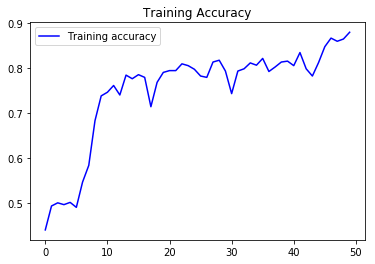

In [147]:
accuracy = MOD.history['acc']
loss = MOD.history['loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.title('Training Accuracy')
plt.legend()
plt.show()

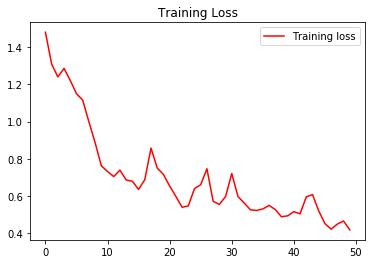

In [148]:
plt.plot(epochs, loss, 'r', label='Training loss')
plt.title('Training Loss')
plt.legend()
plt.show()

In [160]:
test_images_ = np.asarray(test_images)
PREDICT1 = model.predict_classes(test_images_)
metrics.accuracy_score(PREDICT1, current_input_test_labels)

0.45185185185185184